## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

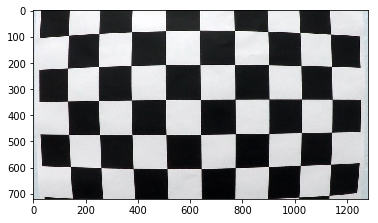

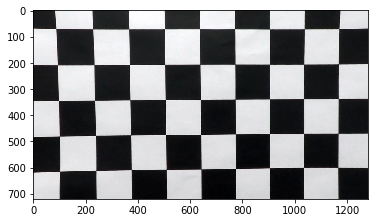

In [520]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

def calibrate_camera(img_shape, calib_path="camera_cal/calibration*.jpg"):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    # Make a list of calibration images
    images = glob.glob(calib_path)
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        #plt.imshow(img)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #plt.imshow(img)
            #plt.show()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape, None, None)
    return (ret, mtx, dist, rvecs, tvecs)
#plt.show()

first_image = cv2.imread(images[0])
first_gray = cv2.cvtColor(first_image, cv2.COLOR_BGR2GRAY)
first_gray_shape = first_gray.shape[::-1]

ret, corners = cv2.findChessboardCorners(first_gray, (9,6),None)
first_with_corners = cv2.drawChessboardCorners(first_image, (9,6), corners, ret)
plt.imshow(first_with_corners)
plt.show()


ret, mtx, dist, rvecs, tvecs = calibrate_camera(first_gray_shape)

first_undistorted = cv2.undistort(first_image, mtx, dist, None, mtx)
plt.imshow(first_undistorted)
plt.show()

## Load and undistort test images

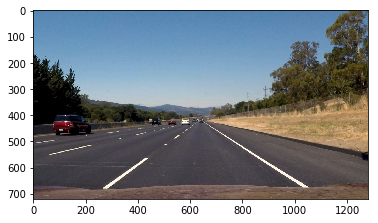

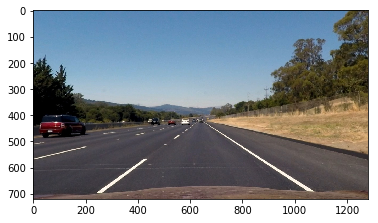

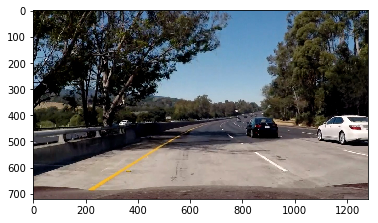

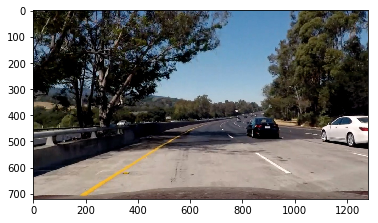

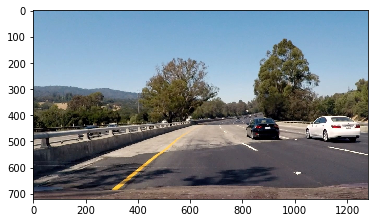

...

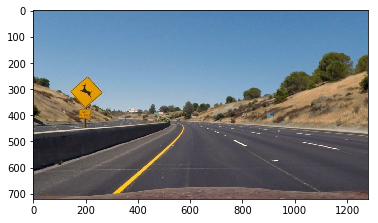

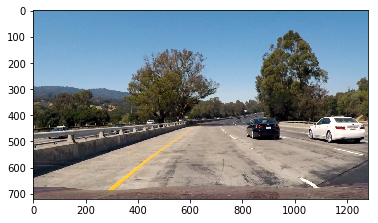

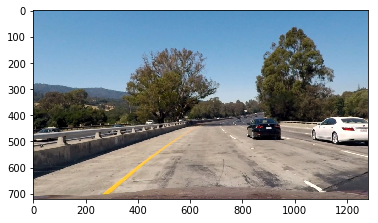

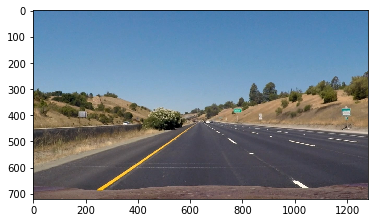

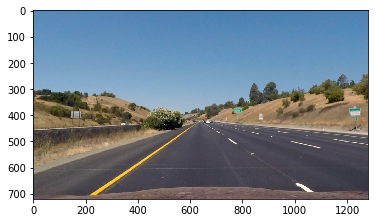

In [521]:
# Make a list of test images
def undistort_image(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)
test_images = glob.glob('test_images/*.jpg')
undistorted_images = []
for fname in test_images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistorted = undistort_image(img, mtx, dist)
    undistorted_images.append(img_undistorted)
    plt.imshow(img)
    plt.show()
    plt.imshow(img_undistorted)
    plt.show()

## Threshold images

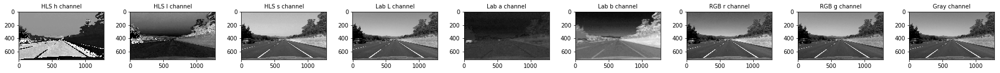

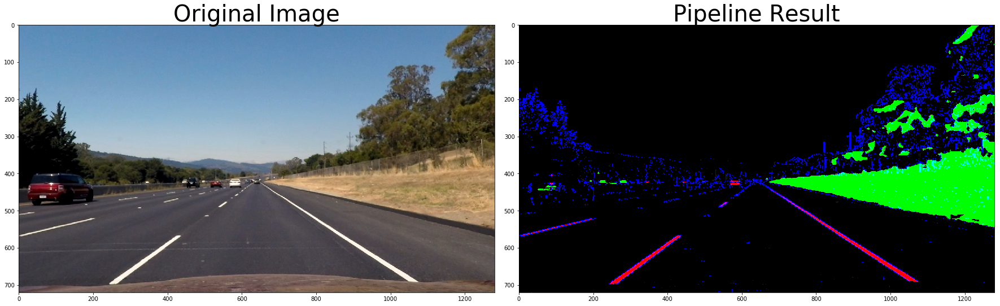

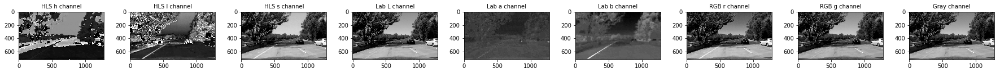

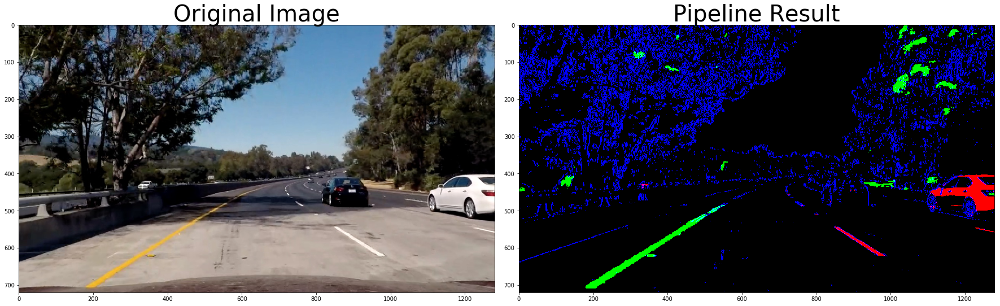

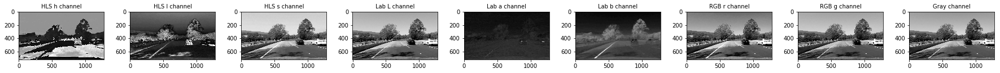

...

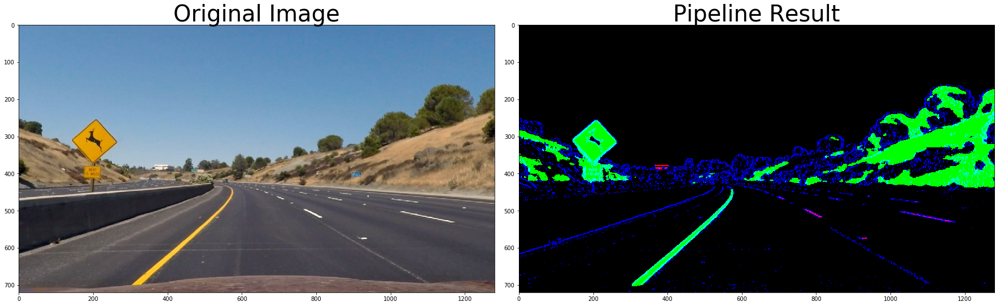

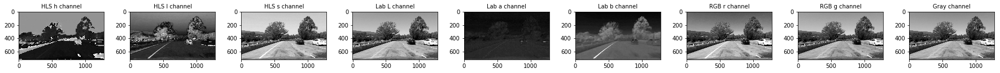

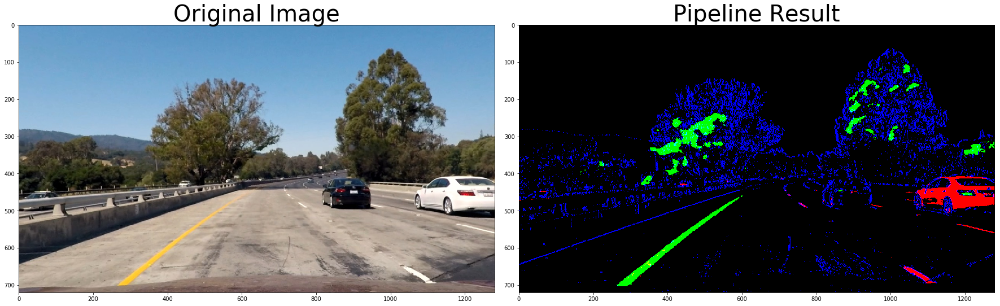

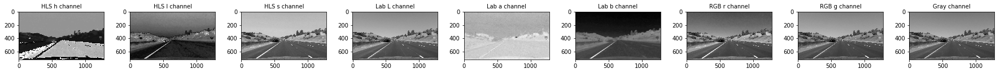

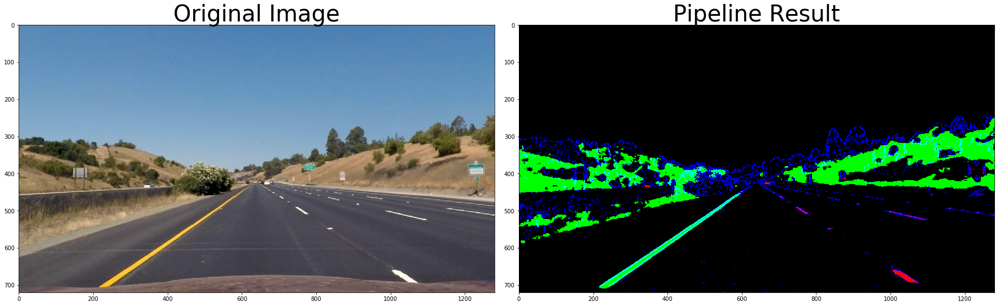

In [531]:
## Convert images to HLS and HSV spaces along with the RGB spaces.
rgb_images = undistorted_images

def threshold_image(img, grad_threshold=(20, 100), color_threshold=(145, 255), show_channels=False):
    img = np.copy(img)
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    gray_channel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    ## hls channels
    hls_s_channel = hls_img[:,:,2]
    hls_l_channel = hls_img[:,:,1]
    ## hsv channels
    lab_a_channel = lab_img[:,:,1]
    lab_b_channel = lab_img[:,:,2]
    lab_l_channel = lab_img[:,:,0]
    
    if show_channels:
        ## Plot all of them to see which would be best for thresholding.
        ## hls channels
        hls_h_channel = hls_img[:,:,0]
        hls_l_channel = hls_img[:,:,1]
        hls_s_channel = hls_img[:,:,2]
        ## hsv channels
        lab_l_channel = lab_img[:,:,0]
        lab_a_channel = lab_img[:,:,1]
        lab_b_channel = lab_img[:,:,2]
        ## rgb channels
        rgb_r_channel = img[:,:,0]
        rgb_g_channel = img[:,:,1]
        rgb_b_channel = img[:,:,2]
        f, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(1, 9, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(hls_h_channel, cmap="gray")
        ax1.set_title('HLS h channel', fontsize=10)

        ax2.imshow(hls_l_channel, cmap="gray")
        ax2.set_title('HLS l channel', fontsize=10)

        ax3.imshow(hls_s_channel, cmap="gray")
        ax3.set_title('HLS s channel', fontsize=10)

        ax4.imshow(lab_l_channel, cmap="gray")
        ax4.set_title('Lab L channel', fontsize=10)

        ax5.imshow(lab_a_channel, cmap="gray")
        ax5.set_title('Lab a channel', fontsize=10)

        ax6.imshow(lab_b_channel, cmap="gray")
        ax6.set_title('Lab b channel', fontsize=10)

        ax7.imshow(rgb_r_channel, cmap="gray")
        ax7.set_title('RGB r channel', fontsize=10)

        ax8.imshow(rgb_g_channel, cmap="gray")
        ax8.set_title('RGB g channel', fontsize=10)

        ax9.imshow(gray_channel, cmap="gray")
        ax9.set_title('Gray channel', fontsize=10)

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    
    # Sobel x
    sobelx = cv2.Sobel(lab_l_channel, cv2.CV_64F, 1, 0, ksize=3) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= grad_threshold[0]) & (scaled_sobel <= grad_threshold[1])] = 1
    
    s_binary2 = np.zeros_like(lab_b_channel)
    s_binary2[(lab_b_channel >= 150) & (lab_b_channel <= color_threshold[1])] = 1
    
    s_binary = np.zeros_like(lab_l_channel)
    s_binary[(lab_l_channel >= 220) & (lab_l_channel <= color_threshold[1])] = 1
    
    sx_binary2 = np.zeros_like(hls_l_channel)
    sobelx2 = cv2.Sobel(hls_l_channel, cv2.CV_64F, 1, 0, ksize=15)
    abs_sobelx2 = np.absolute(sobelx2)
    scaled_sobel2 = np.uint8(255*abs_sobelx2/np.max(abs_sobelx2))
    sx_binary2[(scaled_sobel2 >= grad_threshold[0]) & (scaled_sobel2 <= grad_threshold[1])] = 1
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    ## Currently green is sobel while blue is color.
    ##color_binary = np.dstack(( sx_binary2, sxbinary, s_binary)) * 255
    #color_binary = np.dstack((sx_binary2, canny_img, s_binary2)) * 255
    color_binary = np.dstack((s_binary, s_binary2, sxbinary)) * 255
    return color_binary
    '''
    sobelx = cv2.Sobel(hsv_s_channel, cv2.CV_64F, 1, 0, ksize=3) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= grad_threshold[0]) & (scaled_sobel <= grad_threshold[1])] = 1
    
    s_binary2 = np.zeros_like(hls_s_channel)
    s_binary2[(hls_s_channel >= color_threshold[0]) & (hls_s_channel <= color_threshold[1])] = 1
    
    sx_binary2 = np.zeros_like(hsv_v_channel)
    sobelx2 = cv2.Sobel(hsv_v_channel, cv2.CV_64F, 1, 0, ksize=15)
    abs_sobelx2 = np.absolute(sobelx2)
    scaled_sobel2 = np.uint8(255*abs_sobelx2/np.max(abs_sobelx2))
    sx_binary2[(scaled_sobel2 >= grad_threshold[0]) & (scaled_sobel2 <= grad_threshold[1])] = 1
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    ## Currently green is sobel while blue is color.
    ##color_binary = np.dstack(( sx_binary2, sxbinary, s_binary)) * 255
    #color_binary = np.dstack((sx_binary2, canny_img, s_binary2)) * 255
    color_binary = np.dstack((sx_binary2, s_binary2, sxbinary)) * 255
    return color_binary
    '''
    
for test_image in rgb_images:
    try:
        temp_result = threshold_image(test_image, show_channels=True)
    except Exception as e:
        print(e)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(test_image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(temp_result)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective transform image for birds-eye view

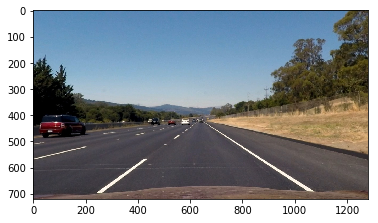

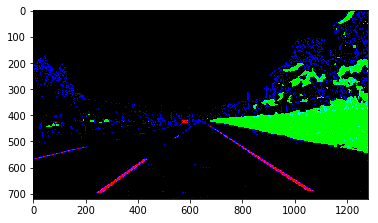

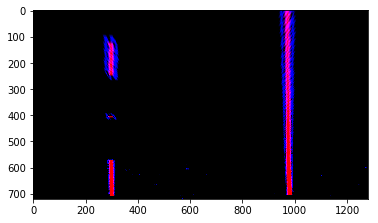

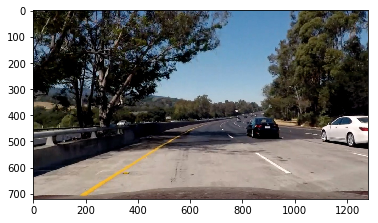

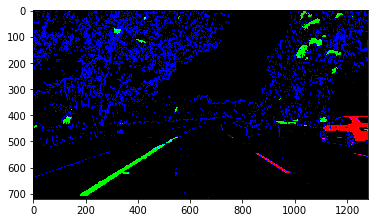

...

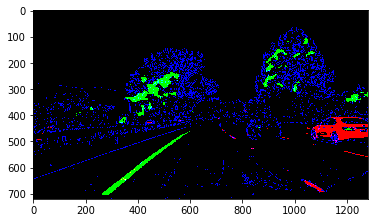

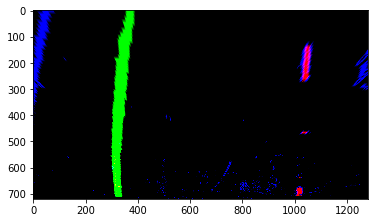

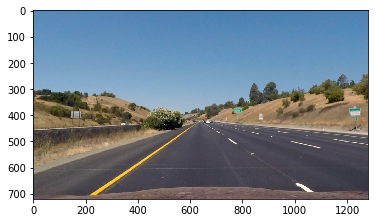

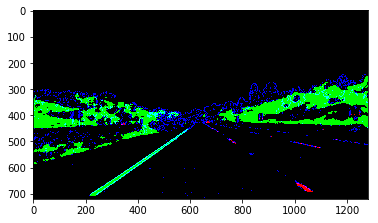

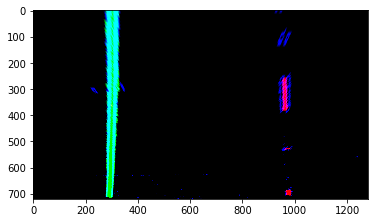

In [539]:
def perspective_transform(temp_image, draw_lines=True):
    ## For now just draw the lines on the image that is going to be transformed.
    image_shape = temp_image.shape
    image_size = (image_shape[1], image_shape[0])
    #print(image_shape)
    image_width = image_shape[1]
    image_height = image_shape[0]
    ## Bottom right, top right, top left, bottom left.
    source_points = np.float32([
        [image_width * 0.865, image_height * 1.0],
        [image_width * 0.562, image_height * 0.65],
        [image_width * 0.445, image_height * 0.65],
        [image_width * 0.17, image_height * 1.0]
    ])
    '''
    source_points = np.float32([
        [image_width * 0.865, image_height * 1.0],
        [image_width * 0.542, image_height * 0.63],
        [image_width * 0.462, image_height * 0.63],
        [image_width * 0.17, image_height * 1.0]
    ])
    '''
    #print(source_points)
    
    offset = 300
    destination_points = np.float32([
                                     [image_size[0]-offset, image_size[1]-offset], 
                                     [offset, image_size[1]-offset],[offset, offset], [image_size[0]-offset, offset]])
    
    destination_points = np.float32([
        [image_width - offset, image_height],
        [image_width - offset, 0],
        [offset, 0],
        [offset, image_height]
    ])
    '''
    destination_points = np.float32([
        [image_width * 0.9999, image_height * 1.0],
        [image_width * 0.9999, 0],
        [image_width * 0.0001, 0],
        [image_width * 0.0001, image_height * 1.0]
    ])
    '''
    draw_image = np.copy(temp_image)
    if draw_lines:
        draw_image = cv2.line(draw_image,
                              (source_points[0][0],source_points[0][1]),
                              (source_points[1][0],source_points[1][1]),
                              (255,0,0),5)
        draw_image = cv2.line(draw_image,
                              (source_points[1][0],source_points[1][1]),
                              (source_points[2][0],source_points[2][1]),
                              (255,0,0),5)
        draw_image = cv2.line(draw_image,
                              (source_points[2][0],source_points[2][1]),
                              (source_points[3][0],source_points[3][1]),
                              (255,0,0),5)
        draw_image = cv2.line(draw_image,
                              (source_points[3][0],source_points[3][1]),
                              (source_points[0][0],source_points[0][1]),
                              (255,0,0),5)
        plt.imshow(draw_image)
        plt.show()
    M = cv2.getPerspectiveTransform(source_points, destination_points)
    Minv = cv2.getPerspectiveTransform(destination_points, source_points)
    warped = cv2.warpPerspective(draw_image, M, image_size, flags=cv2.INTER_LINEAR)
    
    return (warped, Minv)

warped_images = []
for test_image in rgb_images:
    plt.imshow(test_image)
    plt.show()
    temp_image = threshold_image(test_image)
    plt.imshow(temp_image)
    plt.show()
    temp_image, Minv = perspective_transform(temp_image, draw_lines=False)
    warped_images.append(temp_image)
    plt.imshow(temp_image)
    plt.show()

## Search through the images for the lane areas.

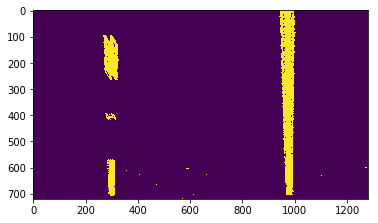

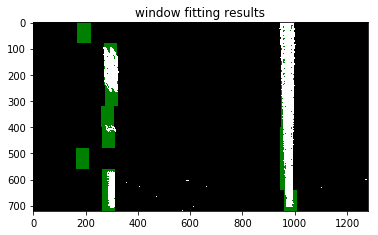

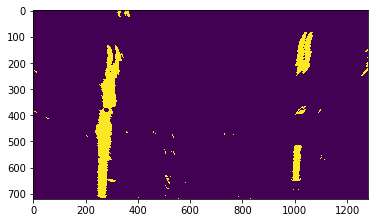

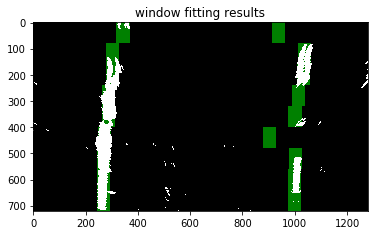

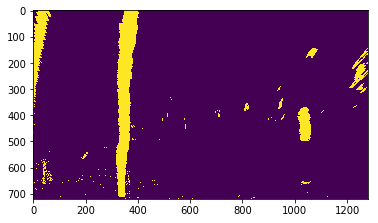

...

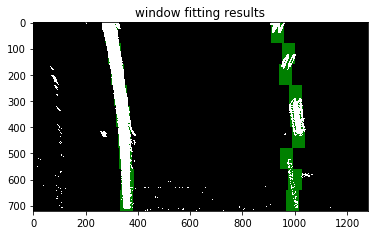

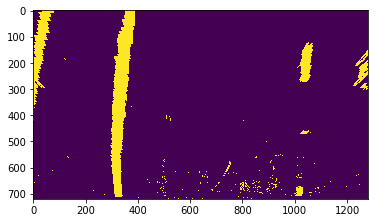

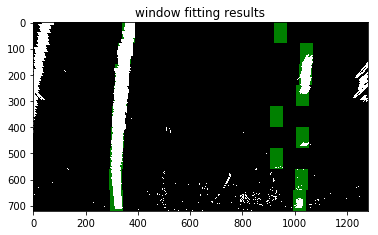

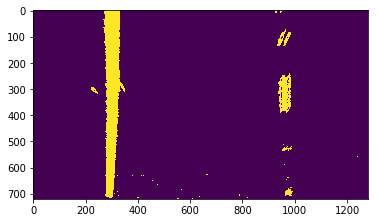

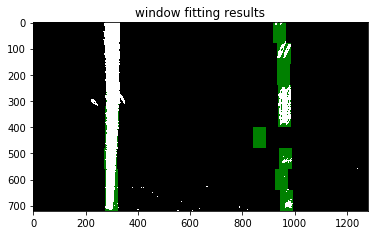

In [540]:
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def get_windows(warped):
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(temp_gray)
        r_points = np.zeros_like(temp_gray)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
        
        return (l_points, r_points)
    
    else:
        return (None, None)
    
def convert_and_threshold(image):
    temp_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    #plt.imshow(temp_gray)
    #plt.show()
    return cv2.threshold(temp_gray, 10, 255, cv2.THRESH_BINARY)[1]

window_list = []
for test_image in warped_images:
    warped = convert_and_threshold(test_image)
    plt.imshow(warped)
    plt.show()
    l_points, r_points = get_windows(warped)
    window_list.append((l_points, r_points))
    if l_points != None:
        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

    # Display the final results
    #print(output.shape)
    #plt.imshow(template)
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()

## Meausure curvature

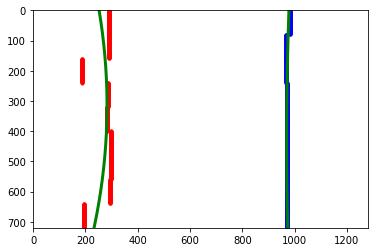

540.930998803 m 3448.00531234 m


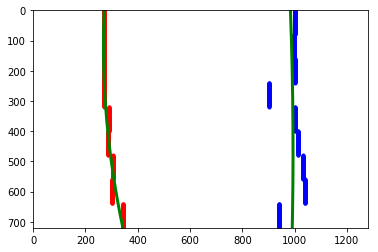

808.02453244 m 3579.22316128 m


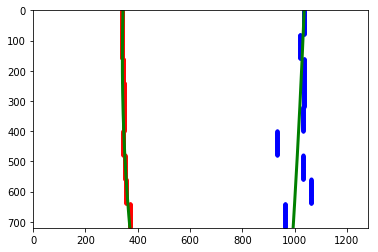

1793.14240376 m 9852.44259128 m


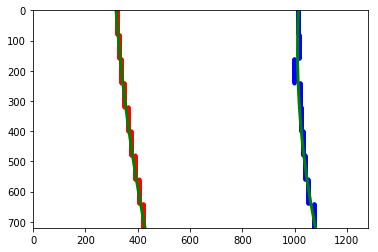

1746.38458674 m 831.248069471 m


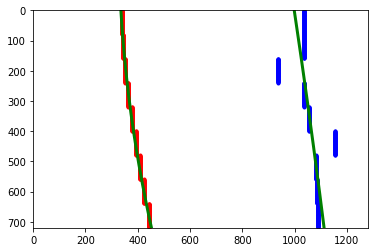

1260.36301459 m 8770.39567783 m


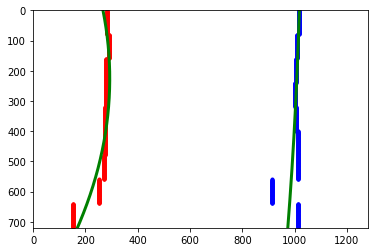

326.618837361 m 4222.77572486 m


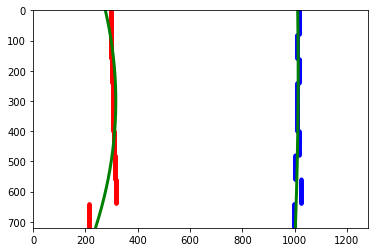

373.839649113 m 3963.32064723 m


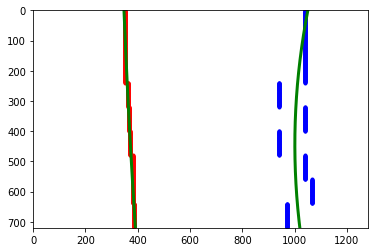

7778.3886692 m 653.319199682 m


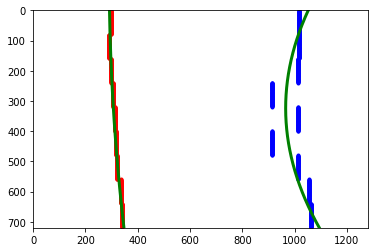

2086.34014726 m 201.916136143 m


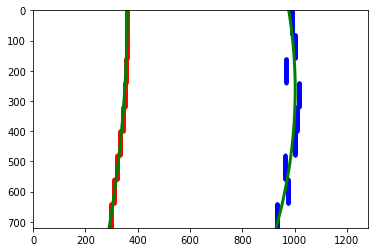

1276.54097448 m 467.093608737 m


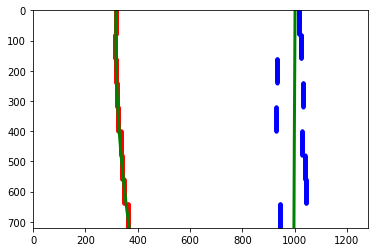

1335.49718761 m 79567.8782281 m


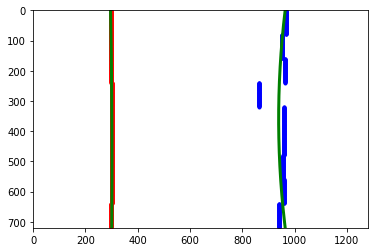

7441.61268553 m 853.844811227 m


In [541]:

def get_functions(window_pair, image_height, plot_the_data=False):
    left_x = []
    right_x = []
    
    ploty = np.linspace(0, image_height-1, num=image_height)
    
    for line in range(image_height):
        active_cells_left = np.nonzero(window_pair[0][line])
        left_x.append(np.median(active_cells_left))
        active_cells_right = np.nonzero(window_pair[1][line])
        right_x.append(np.median(active_cells_right))
    left_x = np.array(left_x)
    right_x = np.array(right_x)
    
    leftx = left_x[::-1]  # Reverse to match top-to-bottom in y
    rightx = right_x[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)

    # Plot up the data
    if plot_the_data:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        mark_size = 3
        plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
        plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
        plt.xlim(0, 1280)
        plt.ylim(0, 720)
        plt.plot(left_fitx, ploty, color='green', linewidth=3)
        plt.plot(right_fitx, ploty, color='green', linewidth=3)
        plt.gca().invert_yaxis() # to visualize as we do the images
        plt.show()

    y_eval = np.max(ploty)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    if plot_the_data:
        print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    return (left_fit, right_fit, ploty, left_curverad, right_curverad)

for window_pair in window_list:
    get_functions(window_pair, 720, plot_the_data=True)
    # Define conversions in x and y from pixels space to meters





## Draw lines and return image.

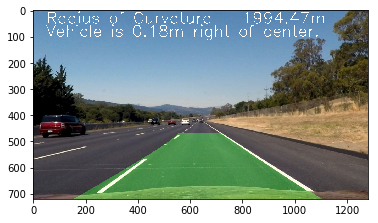

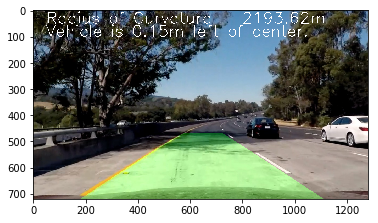

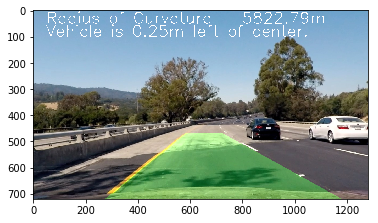

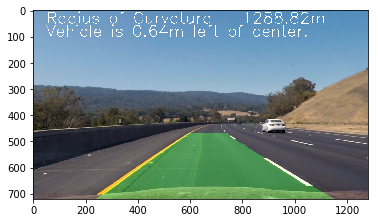

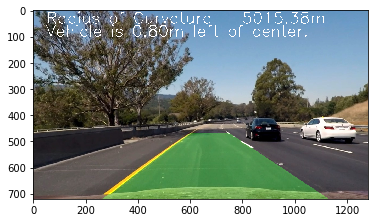

...

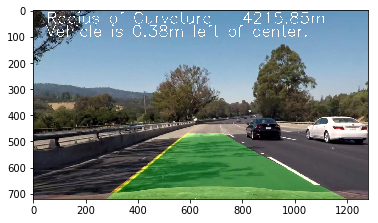

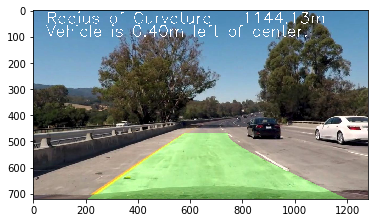

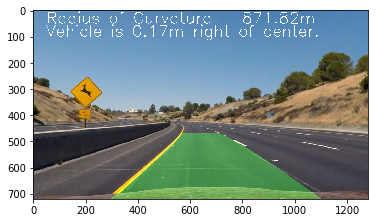

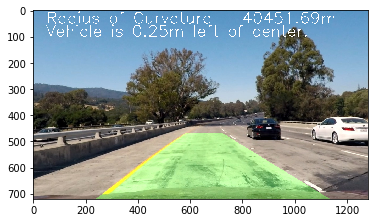

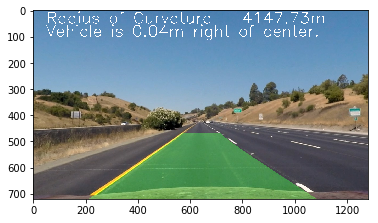

In [546]:
## Order of functions

class Frame_Processor:
    def __init__(self):
        self.last_frame = None
        self.second_to_last_frame = None
        self.video_image = False
    
    

    def process_image(self, img, plot_intermediary=False):
        base_image = np.copy(img)
        gray_image = cv2.cvtColor(base_image, cv2.COLOR_RGB2GRAY)
        img_shape = gray_image.shape[::-1]
        ret, mtx, dist, rvecs, tvecs = calibrate_camera(img_shape)
        ## image == undistorted_image
        undistorted_image = undistort_image(base_image, mtx, dist)
        thresholded_image = threshold_image(undistorted_image)
        perspective_transformed_image, Minv = perspective_transform(thresholded_image, draw_lines=False)
        ## monochrome_image == warped
        monochrome_image = convert_and_threshold(perspective_transformed_image)
        if self.video_image == True:
            if self.last_frame == None:
                self.last_frame = np.copy(monochrome_image)
                self.second_to_last_frame = np.copy(monochrome_image)
            #zero_channel = np.zeros_like(monochrome_image)
            last_three = np.array(cv2.merge((monochrome_image, self.second_to_last_frame, self.last_frame)),np.uint8)
            self.second_to_last_frame = np.copy(self.last_frame)
            self.last_frame = np.copy(monochrome_image)
            monochrome_image = convert_and_threshold(last_three)
        if plot_intermediary:
            plt.imshow(base_image)
            plt.show()
            plt.imshow(undistorted_image)
            plt.show()
            plt.imshow(thresholded_image)
            plt.show()
            plt.imshow(perspective_transformed_image)
            plt.show()
            plt.imshow(monochrome_image)
            plt.show()

        ## l_points == pts_left, r_points == pts_right
        l_points, r_points = get_windows(monochrome_image)


        left_fit, right_fit, ploty, left_curverad, right_curverad = get_functions((l_points, r_points), undistorted_image.shape[0], plot_the_data=False)

        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        left_fitx = np.flipud(left_fitx) 
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        right_fitx = np.flipud(right_fitx)

        temp_left_point = left_fitx[0]
        temp_right_point = right_fitx[0]
        lane_center = (temp_left_point + temp_right_point) // 2
        lane_width = (temp_right_point - temp_left_point)

        pix_to_meter_ratio = 3.7 / lane_width
        ## Offset in pixels.
        offset = ((img.shape[1] / 2) - lane_center)
        ## Offset in meters.
        offset = offset * pix_to_meter_ratio

        radius_of_curvature = (left_curverad + right_curverad) / 2

        ## Write radius and offset onto image.
        cv2.putText(undistorted_image,'Radius of Curvature = {0:.2f}m'.format(radius_of_curvature), 
                    (50,50), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    2,
                    (255,255,255),
                    2)
        if offset < 0:
            side_val = "left"
        else:
            side_val = "right"
        cv2.putText(undistorted_image,'Vehicle is {0:.2f}m {1} of center.'.format(abs(offset), side_val), 
                    (50,100), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    2,
                    (255,255,255),
                    2)

        warp_zero = np.zeros_like(monochrome_image).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int32([pts]), (0,255, 0))
        ##cv2.polylines(color_warp, [pts],True,(0,255,255))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (base_image.shape[1], base_image.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)
        if plot_intermediary:
            if l_points != None:
                # Draw the results
                template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
                zero_channel = np.zeros_like(monochrome_image) # create a zero color channel
                template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
                warpage = np.array(cv2.merge((monochrome_image,monochrome_image,monochrome_image)),np.uint8) # making the original road pixels 3 color channels
                output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

            # If no window centers found, just display orginal road image
            else:
                output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

            # Display the final results
            #print(output.shape)
            #plt.imshow(template)
            plt.imshow(output)
            plt.title('window fitting results')
            plt.show()

        return result
    
test_images = glob.glob('test_images/*.jpg')
undistorted_images = []
processor = Frame_Processor()
for fname in test_images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = processor.process_image(img, False)
    output_name = "output_images/" + fname.split('/')[1]
    cv2.imwrite(output_name, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
    plt.imshow(result)
    plt.show()
    

## Process video file.

In [547]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

processor = Frame_Processor()
processor.video_image = True

white_output = 'project_video_processed.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(processor.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


100%|█████████▉| 1260/1261 [2:48:24<00:08,  8.04s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 

CPU times: user 3h 21min 27s, sys: 22.8 s, total: 3h 21min 50s
Wall time: 2h 48min 25s
